<a href="https://colab.research.google.com/github/JaredHoang/test/blob/main/Copy_of_Combination_of_Module_1_and_Module_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Module 1 - Data Load / Display / Normalization

In this module you will learn how to load a nifti image utilizing  nibabel and create datasets that can be used with machine learning algorithms. The basic features we will consider are intensity based and originate from multiple acquisition types. 

### Step 1: Load basic python libraries 

In [ ]:
%matplotlib inline
import os 
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
import csv
from pandas.plotting import scatter_matrix
from sklearn import preprocessing
import nibabel as nib

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Step 2: Load the three types of images available. 

- T1w pre-contrast
- FLAIR 
- T1w post-contrast 

The goal is to  create a 4D image that contains all four 3D volumes we will use in our example

In [ ]:
test_load = nib.load('/content/drive/MyDrive/Data/POST.nii.gz').get_fdata()
test_load.shape

(240, 240, 155)

In [ ]:
# read Pre in--we assume that all images are same x,y dims
Pre = nib.load('/content/drive/MyDrive/Data/POST.nii.gz')
# Pre is a class containing the image data among other information 
Pre=Pre.get_data()
xdim = np.shape(Pre)[0]
ydim = np.shape(Pre)[1]
zdim = np.shape(Pre)[2]
# Printing the dimensions of an image 
print ('Dimensions')
print (xdim,ydim,zdim)
# Normalize to mean
Pre=Pre/np.mean(Pre[np.nonzero(Pre)])
# Post
Post = nib.load('/content/drive/MyDrive/Data/POST.nii.gz')
Post=Post.get_data()
# Normalize to mean
Post=Post/np.mean(Post[np.nonzero(Post)])
Flair = nib.load('/content/drive/MyDrive/Data/FLAIR.nii.gz')
Flair=Flair.get_data()
# Normalize FLAIR 
Flair=Flair/np.mean(Flair[np.nonzero(Flair)])
print ("Data Loaded")

<ipython-input-4-092403a3a696>:4: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  Pre=Pre.get_data()


Dimensions
240 240 155


<ipython-input-4-092403a3a696>:15: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  Post=Post.get_data()
<ipython-input-4-092403a3a696>:19: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  Flair=Flair.get_data()


Data Loaded


### Create traing set

We assume the following labels. 

> Enhancing Tumor = 4

> Edema = 2

> WM and CSF and GM=1

> Background (air) = 0
    

In [ ]:
#  Load Ground Truth
GroundTrutha = nib.load('/content/drive/MyDrive/Data/GroundTruth.nii.gz')
GroundTruth=GroundTrutha.get_data()
print ("Data Loaded")

Data Loaded


<ipython-input-5-1713b7adbfef>:3: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  GroundTruth=GroundTrutha.get_data()


#### Plot the images 

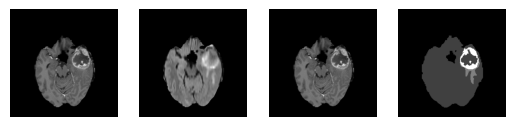

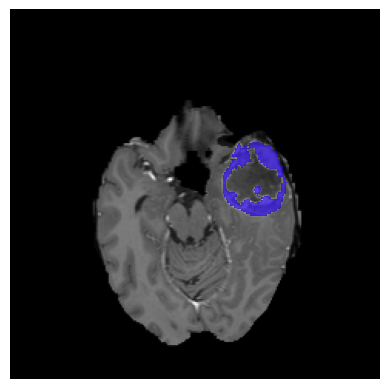

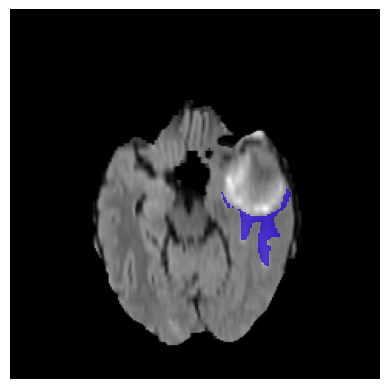

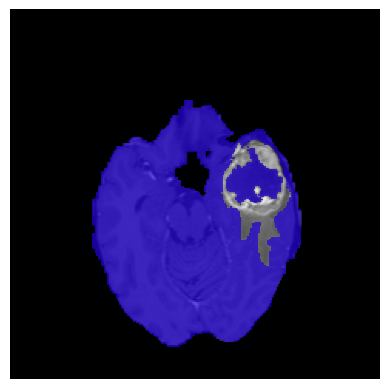

In [ ]:
def display_overlay(Image1, Image2):
    """
    Function: Overlays Image2 over Image1
    Image 1: 2D image
    Image 2: 2D Image

    Requires numpy, matplotlib
    """
    Image1=np.rot90(Image1,3)
    Image2=np.rot90(Image2,3)
    Image2 = np.ma.masked_where(Image2 == 0, Image2)
    plt.imshow(Image1, cmap=plt.cm.gray)
    plt.imshow(Image2, cmap=plt.cm.brg, alpha=.7, vmin=.7, vmax=5, interpolation='nearest')
    plt.axis('off')
    plt.show()

f, (ax1,ax2,ax3,ax4)=plt.subplots(1,4)
ax1.imshow(np.rot90(Post[:, :, 55,],3), cmap=plt.cm.gray)
ax1.axis('off')
ax2.imshow(np.rot90(Flair[:, :, 55,],3), cmap=plt.cm.gray)
ax2.axis('off')
ax3.imshow(np.rot90(Pre[:, :, 55,],3), cmap=plt.cm.gray)
ax3.axis('off')
ax4.imshow(np.rot90(GroundTruth[:, :, 55,],3), cmap=plt.cm.gray)
ax4.axis('off')

plt.show()

display_overlay(Post[:, :, 55,], GroundTruth[:,:,55]==4)  
display_overlay(Flair[:, :, 55,], GroundTruth[:,:,55]==2)  
display_overlay(Pre[:, :, 55,], GroundTruth[:,:,55]==1)    

### Create dataset

In [ ]:
# Create classes
# Tissue =GM+CSG+WM
ClassTissuePost=(Post[np.nonzero(GroundTruth==1)])
ClassTissuePre=(Pre[np.nonzero(GroundTruth==1)])
ClassTissueFlair=(Flair[np.nonzero(GroundTruth==1)])
# Enhancing Tumor 
ClassTumorPost=(Post[np.nonzero(GroundTruth==4)])
ClassTumorPre=(Pre[np.nonzero(GroundTruth==4)])
ClassTumorFlair=(Flair[np.nonzero(GroundTruth==4)])
# Edema 
ClassEdemaPost=(Post[np.nonzero(GroundTruth==2)])
ClassEdemaPre=(Pre[np.nonzero(GroundTruth==2)])
ClassEdemaFlair=(Flair[np.nonzero(GroundTruth==2)])
# We only select 1000 points for demosntration purposes
IND=np.random.randint(np.shape(ClassTumorPre)[0], size=5000)
ClassTissuePost=ClassTissuePost[IND]
ClassTissuePre=ClassTissuePre[IND]
ClassTissueFlair=ClassTissueFlair[IND]
ClassTumorPost=ClassTumorPost[IND]
ClassTumorPre=ClassTumorPre[IND]
ClassTumorFlair=ClassTumorFlair[IND]
ClassEdemaPost=ClassEdemaPost[IND]
ClassEdemaPre=ClassEdemaPre[IND]
ClassEdemaFlair=ClassEdemaFlair[IND]
print ("Saving the data to a pandas dataframe and subsequently to a csv")
# Create a dictionary containing the classes
datasetcomplete={"ClassTissuePost": ClassTissuePost, "ClassTissuePre": ClassTissuePre, "ClassTissueFlair": ClassTissueFlair, "ClassTumorPost": ClassTumorPost, "ClassTumorPre": ClassTumorPre, "ClassTumorFlair": ClassTumorFlair, "ClassEdemaPost": ClassEdemaPost, "ClassEdemaPre": ClassEdemaPre, "ClassEdemaFlair": ClassEdemaFlair}
datapd=pd.DataFrame.from_dict(datasetcomplete,orient="index")
# print (datapd)
datapd=datapd.transpose()
# datapd=pd.DataFrame(dict([ (k,Series(v)) for k,v in datasetcomplete.iteritems() ]))
datapd.to_csv("DataExample.csv",index=False)

Saving the data to a pandas dataframe and subsequently to a csv


### Create some scatter plots

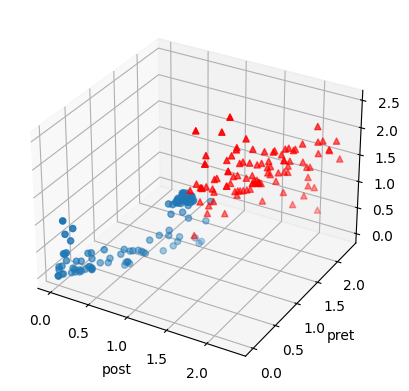

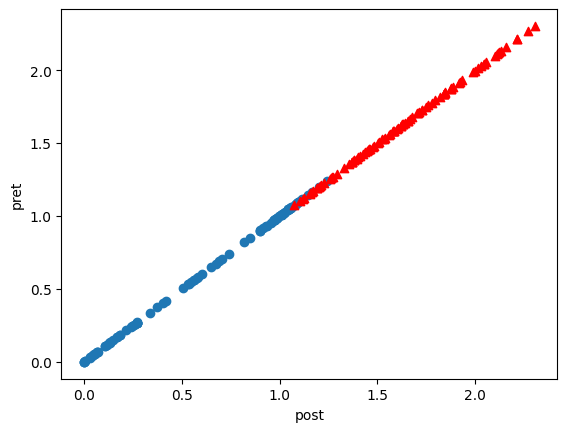

In [ ]:
# Display Tumor vs NAWM
IND=np.random.randint(1000, size=100)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(ClassTissuePost[IND,], ClassTissuePre[IND,], ClassTissueFlair[IND,])
ax.scatter(ClassTumorPost[IND,], ClassTumorPre[IND,], ClassTumorFlair[IND,], c='r', marker='^')
ax.set_xlabel('post')
ax.set_ylabel('pret')
ax.set_zlabel('FLAIR')
plt.show()
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(ClassTissuePost[IND,], ClassTissuePre[IND,])
ax.scatter(ClassTumorPost[IND,], ClassTumorPre[IND,], c='r', marker='^')
ax.set_xlabel('post')
ax.set_ylabel('pret')
plt.show()

## Describe the data 

In [ ]:
# descriptions
print(datapd.describe())

       ClassTissuePost  ClassTissuePre  ClassTissueFlair  ClassTumorPost  \
count      5000.000000     5000.000000       5000.000000     5000.000000   
mean          0.677356        0.677356          0.592026        1.593639   
std           0.422639        0.422639          0.438439        0.325380   
min           0.000000        0.000000          0.000000        0.322622   
25%           0.209190        0.209190          0.160193        1.359591   
50%           0.862679        0.862679          0.504234        1.584080   
75%           1.023892        1.023892          1.050288        1.814615   
max           1.778190        1.778190          1.762446        2.744357   

       ClassTumorPre  ClassTumorFlair  ClassEdemaPost  ClassEdemaPre  \
count    5000.000000      5000.000000     5000.000000    5000.000000   
mean        1.593639         1.391735        1.023936       1.023936   
std         0.325380         0.376386        0.127743       0.127743   
min         0.322622       

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import pylab
from matplotlib.colors import ListedColormap
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier,export_graphviz
import sklearn.metrics as metrics
from sklearn import tree
from IPython.display import Image
from io import StringIO
import pydotplus
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import StandardScaler

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    """
    Generate a simple plot of the test and training learning curve.

    Parameters
    ----------
    estimator : object type that implements the "fit" and "predict" methods
        An object of that type which is cloned for each validation.

    title : string
        Title for the chart.

    X : array-like, shape (n_samples, n_features)
        Training vector, where n_samples is the number of samples and
        n_features is the number of features.

    y : array-like, shape (n_samples) or (n_samples, n_features), optional
        Target relative to X for classification or regression;
        None for unsupervised learning.

    ylim : tuple, shape (ymin, ymax), optional
        Defines minimum and maximum yvalues plotted.

    cv : int, cross-validation generator or an iterable, optional
        Determines the cross-validation splitting strategy.
        Possible inputs for cv are:
          - None, to use the default 3-fold cross-validation,
          - integer, to specify the number of folds.
          - An object to be used as a cross-validation generator.
          - An iterable yielding train/test splits.

        For integer/None inputs, if ``y`` is binary or multiclass,
        :class:`StratifiedKFold` used. If the estimator is not a classifier
        or if ``y`` is neither binary nor multiclass, :class:`KFold` is used.

        Refer :ref:`User Guide <cross_validation>` for the various
        cross-validators that can be used here.

    n_jobs : integer, optional
        Number of jobs to run in parallel (default 1).
    """
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

In [ ]:
Data=pd.read_csv ('DataExample.csv')
# if you need to print or have access to the data as numpy array you can execute the following commands 
# print (Data)
# print(Data.as_matrix(columns=['NAWMpost']))

In [ ]:
ClassBrainTissuepost=(Data['ClassTissuePost'].values)
ClassBrainTissuepost= (np.asarray(ClassBrainTissuepost))
ClassBrainTissuepost=ClassBrainTissuepost[~np.isnan(ClassBrainTissuepost)]
ClassBrainTissuepre=(Data[['ClassTissuePre']].values)
ClassBrainTissuepre= (np.asarray(ClassBrainTissuepre))
ClassBrainTissuepre=ClassBrainTissuepre[~np.isnan(ClassBrainTissuepre)]
ClassTUMORpost=(Data[['ClassTumorPost']].values)
ClassTUMORpost= (np.asarray(ClassTUMORpost))
ClassTUMORpost=ClassTUMORpost[~np.isnan(ClassTUMORpost)]
ClassTUMORpre=(Data[['ClassTumorPre']].values)
ClassTUMORpre= (np.asarray(ClassTUMORpre))
ClassTUMORpre=ClassTUMORpre[~np.isnan(ClassTUMORpre)]
X_1 = np.stack((ClassBrainTissuepost,ClassBrainTissuepre)) # we only take the first two features.
X_2 = np.stack((ClassTUMORpost,ClassTUMORpre))
X=np.concatenate((X_1.transpose(), X_2.transpose()),axis=0)
y =np.zeros((np.shape(X))[0])
y[np.shape(X_1)[1]:]=1

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [ ]:
model = DecisionTreeClassifier()
model.fit(X_train, y_train)
# Print a summary of our model 
print(model)

DecisionTreeClassifier()


In [ ]:
# make predictions
expected = y_test
predicted = model.predict(X_test)
# summarize the fit of the model
print(metrics.classification_report(expected, predicted))
print(metrics.confusion_matrix(expected, predicted))

              precision    recall  f1-score   support

         0.0       0.90      0.90      0.90      1511
         1.0       0.90      0.90      0.90      1489

    accuracy                           0.90      3000
   macro avg       0.90      0.90      0.90      3000
weighted avg       0.90      0.90      0.90      3000

[[1361  150]
 [ 146 1343]]


In [ ]:
max_leaf_nodes_eval =[2,3,4,5,6,9]
classifier = GridSearchCV(estimator=model, cv=5, param_grid=dict(max_leaf_nodes=max_leaf_nodes_eval))
classifier.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'max_leaf_nodes': [2, 3, 4, 5, 6, 9]})

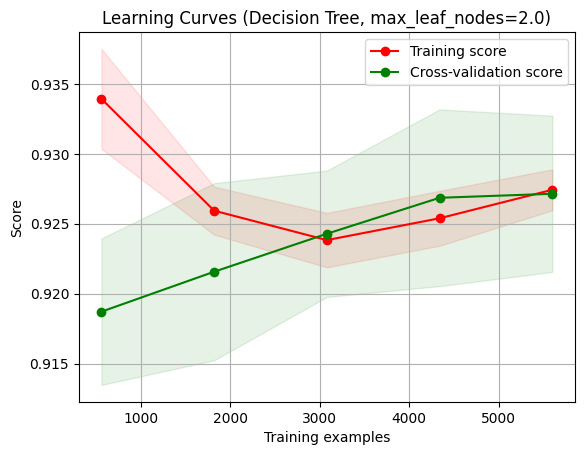

In [ ]:
title = 'Learning Curves (Decision Tree, max_leaf_nodes=%.1f)' %classifier.best_estimator_.max_leaf_nodes
estimator = DecisionTreeClassifier( max_leaf_nodes=classifier.best_estimator_.max_leaf_nodes)
plot_learning_curve(estimator, title, X_train, y_train, cv=5)
plt.show()

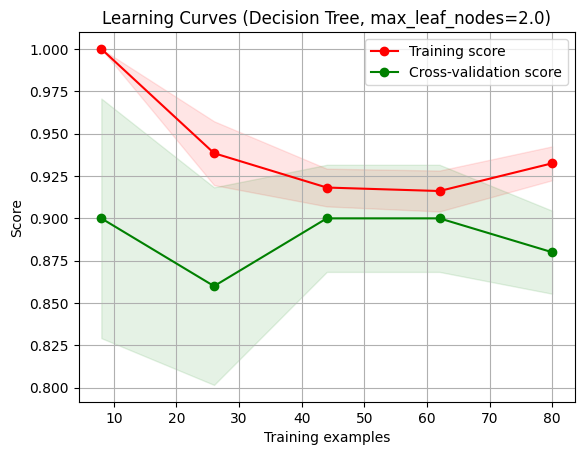

In [ ]:
title = 'Learning Curves (Decision Tree, max_leaf_nodes=%.1f)' %classifier.best_estimator_.max_leaf_nodes
estimator = DecisionTreeClassifier( max_leaf_nodes=classifier.best_estimator_.max_leaf_nodes)
IND=np.random.randint(np.shape(X_train)[0], size=100)
plot_learning_curve(estimator, title, X_train[IND], y_train[IND], cv=5)
plt.show()

In [ ]:
classifier.score(X_test, y_test)

0.928

In [ ]:
from IPython.display import Image  
dot_data = tree.export_graphviz(model, out_file=None, 
                         feature_names=['T1 pre', 'T1w post'],  
                         class_names=['WM', 'Tumor'],  
                         filled=True, rounded=True,  
                         special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())  